In [67]:
from body_matrix import load
from body_matrix import infer
from body_matrix import process

video, frame_counts, fps, sample_frame = load.video(
	"/Users/troydo42/Desktop/Raw_Vids/VID_20230109_154951~2.mp4", 
	-90, 
	10
)

keypoints_model, keypoints_transform = load.keypoints_model("cpu")
selected_box, keypoints = infer.detect_main_target(
	sample_frame, "cpu", 0.8, keypoints_model, keypoints_transform
)

selected_kps = process.keypoints_filter(
	['nose','left_shoulder','right_shoulder'], 
	keypoints
)

segment_model, segment_transform = load.segment_model("cpu")
mask, mask_image, bool_mask = infer.segment_selected_target(
	sample_frame, "cpu", selected_box, 0.99, segment_model, segment_transform
)

segment_area = process.segmentation_area(
	sample_frame, 
	bool_mask
)


Found  8  person in the frame
Distances:  [7.104736328125, 199.69757080078125, 388.6623840332031, 512.9477634429932, 112.25616455078125, 149.0408172607422, 129.7042999267578, 243.60870361328125]
Areas:  [175747.32598744333, 89273.81185868382, 13992.373372022063, 9967.794468692737, 4053.308613561094, 2172.9763013496995, 1824.7933137267828, 2278.850209377706]
FOCUSES:  [24736.64297599972, 447.0450566859603, 36.00135733955336, 19.432377288843593, 36.10767061017394, 14.579739572604103, 14.068872926782056, 9.354551687099352]
Select keypoint index 0
Found  7  person in the frame
[115.15542602539062, 701.7561645507812, 192.35691833496094, 879.9318237304688]
[433.9031982421875, 625.0814819335938, 668.3062744140625, 1374.846923828125]
[429.07958984375, 601.1080932617188, 672.65576171875, 1396.8974609375]
[433.9031982421875, 625.0814819335938, 668.3062744140625, 1374.846923828125]
[650.1878662109375, 670.246826171875, 831.80615234375, 1196.0526123046875]
[433.9031982421875, 625.0814819335938, 66

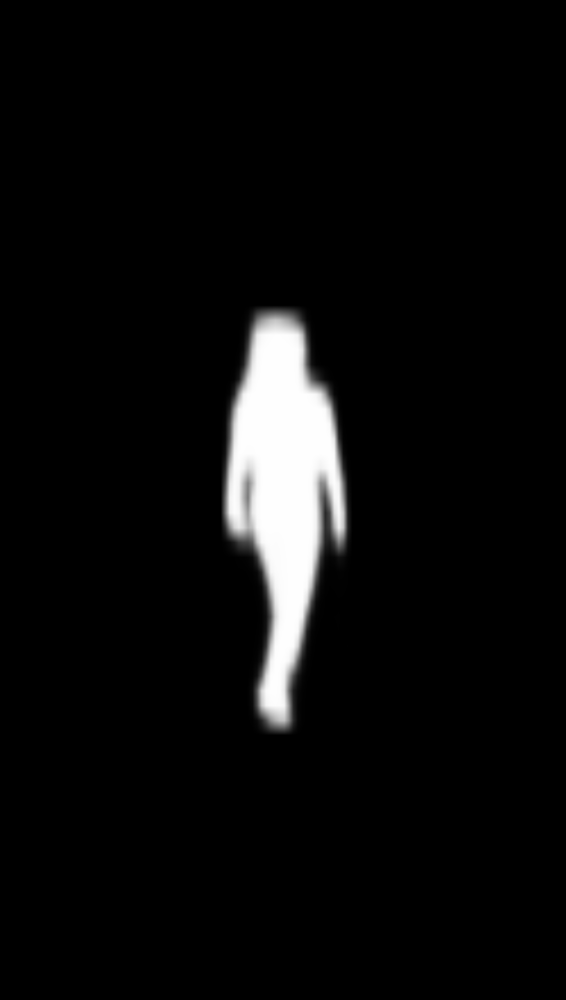

In [68]:
mask_image

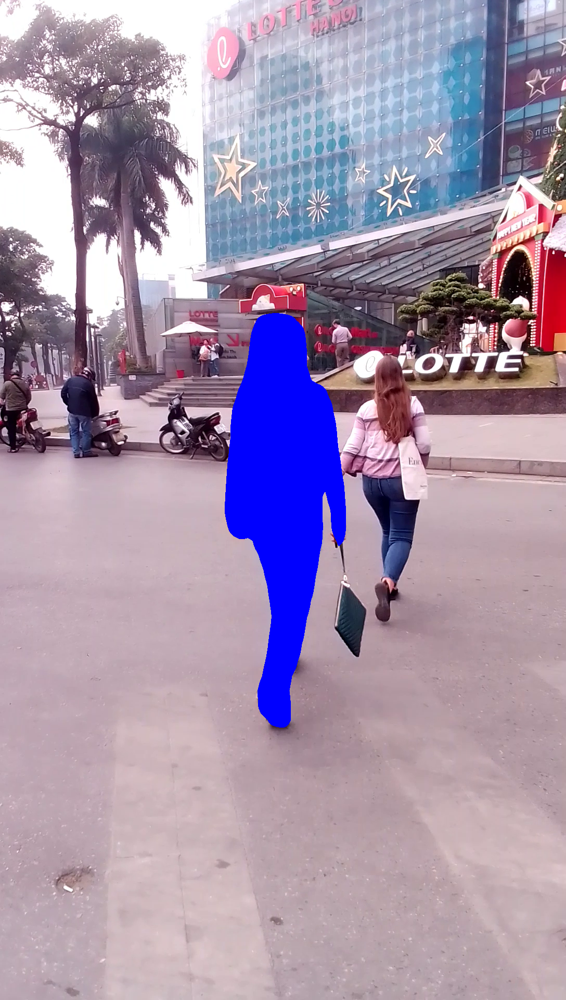

In [69]:
from torchvision.transforms.functional import to_pil_image, pil_to_tensor
import torch
from PIL import ImageColor

tensor_image = pil_to_tensor(sample_frame)
mask = torch.squeeze(bool_mask, 0)
img_to_draw = tensor_image.detach().clone()
color = ImageColor.getrgb('blue')
tensor_color = torch.tensor(color, dtype=torch.uint8)
img_to_draw[:, mask] = tensor_color[:, None]
colored = to_pil_image(img_to_draw)

x, y = torch.where(
    (img_to_draw[2] == 255)
    &(img_to_draw[0] == 0)
    &(img_to_draw[1] == 0)
)
colored

In [70]:
def check_if_contours(point, colored):
    [x, y] = point[0].item(), point[1].item()
    surrounding_pixels = [
        (x-1, y-1),(x, y-1),(x+1, y-1),
        (x-1, y), (x+1, y),
        (x-1, y+1), (x, y+1), (x+1, y+1)
    ]
    checked = 0
    
    for pixel in surrounding_pixels:
        color = colored.getpixel(pixel)
        if color != (0, 0, 255):
            checked = checked + 1
            
    return checked


result = check_if_contours(
    (x[0], y[0]), 
    colored
)

print(result)

8


In [71]:
contours = []
for x, y in zip(y, x):
    result = check_if_contours(
        (x, y), 
        colored
    )
    
    if result != 0:
        contours.append([x.item(), y.item()])


In [72]:
updated_contours = process.segmentation_contour(
    sample_frame, 
    bool_mask
)

In [73]:
print(len(contours))

2327


In [74]:
print(len(updated_contours))

2327


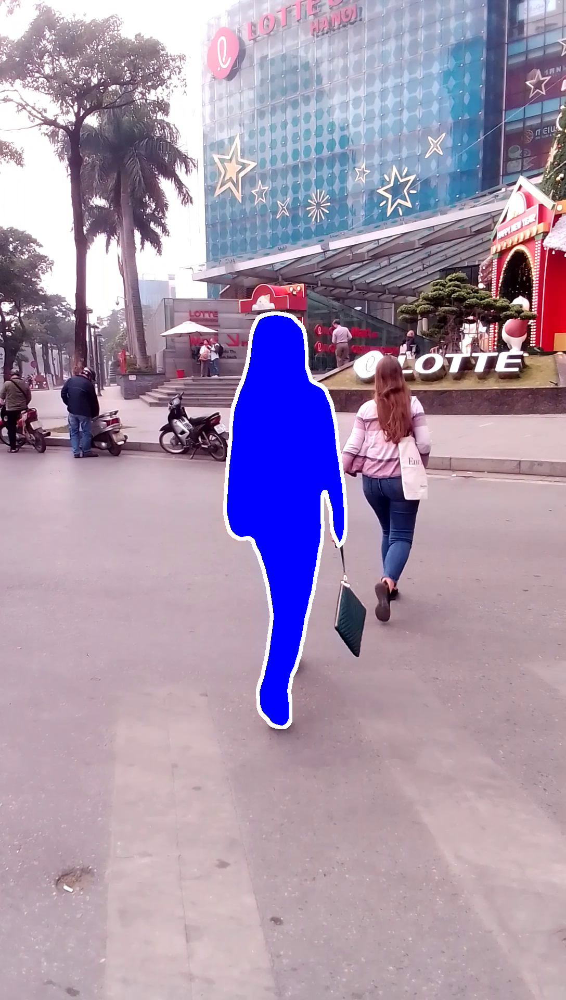

In [75]:
from body_matrix import draw

contoured = colored.copy()
for contour in contours:
    contoured = draw.circle_label(
        contoured, 
        3, 
        contour,
        background_color="#ffffff",
        label=" ", 
        label_font="/Users/troydo42/Desktop/Body_Matrixes/Roboto-Bold.ttf",
        label_color="#ffffff",   
    )
    
contoured

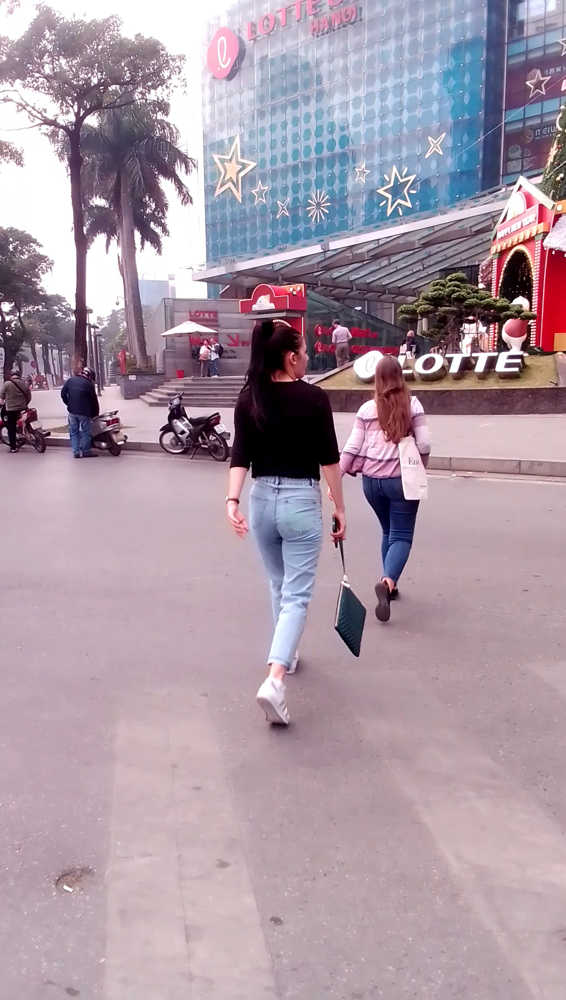

In [76]:
sample_frame

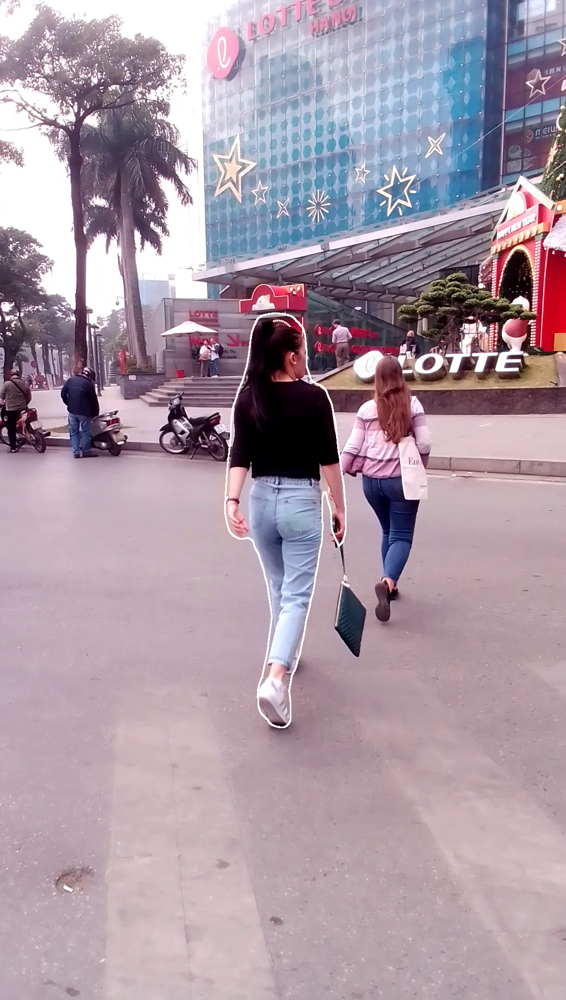

In [77]:
contoured_image = draw.segmentation_contour(
    contour_pixels = updated_contours, 
    contour_color="#ffffff",
    contour_size=1, 
    font="/Users/troydo42/Desktop/Body_Matrixes/Roboto-Bold.ttf",
    image=sample_frame, 
)
contoured_image